 <img src="figures/hiti.png" alt="HITILab" width="150"/>

<!-- Author: Rohan Isaac -->
<!-- Github: rogyizac -->

# Load Our Libraries and Set our GPU Again!

In [27]:
import os
import imageio
import IPython
import matplotlib
import numpy as np
import pandas as pd
from tqdm import tqdm
from PIL import Image
from skimage.io import imsave, imread
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from scipy.ndimage import rotate
from IPython.display import HTML, Video
import random

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader

from PIL import Image
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import roc_auc_score

from datasets import MRIDataset, MRIDataset2D, MRIDataset2DMiddleSlice
from model import Deeper3DCNN, Deeper2DCNN
from train import train_model_3d, train_model_2d_mip, train_model_2d_mid_slice
from evaluate import test_model_3d, test_model_2d

import warnings
warnings.filterwarnings("ignore")

In [28]:
from utils_datathon_mri import (
    load_dicom_image, save_image_as_png, process_study, process_and_save_subtracted_series,
    load_dicom_series, load_png_series, animate_images, animate_images_3d, 
    visualize_and_predict_pt_3d, visualize_and_predict_2d_mip, visualize_mip_from_dataset,
    visualize_middle_slice, visualize_and_predict_2d_mid_slice
)

# ⚠️⚠️⚠️⚠️⚠️ ***Attention*** ⚠️⚠️⚠️⚠️⚠️

Please specify your assigned GPU number.

In [29]:
# Set the GPU device ID as an environment variable
os.environ['CUDA_VISIBLE_DEVICES'] = ''

In [30]:
# Get the GPU device ID from the environment variable, or select one randomly between 0 and 7 if not set
device_id = os.environ.get('CUDA_VISIBLE_DEVICES')

if device_id is None:
    device_id = str(random.randint(0, 3))
    os.environ['CUDA_VISIBLE_DEVICES'] = device_id

# Set the device for PyTorch
device = torch.device(f'cuda:0' if torch.cuda.is_available() else 'cpu')  # cuda:0 refers to the first GPU in the list

print(f'Using device: {device} (GPU ID: {device_id})')

Using device: cuda:0 (GPU ID: 3)


## Training a Custom and Simple 3D model

- To keep it simple we will build a simple custom 3D model built from scratch to train our model that detects the BPE level

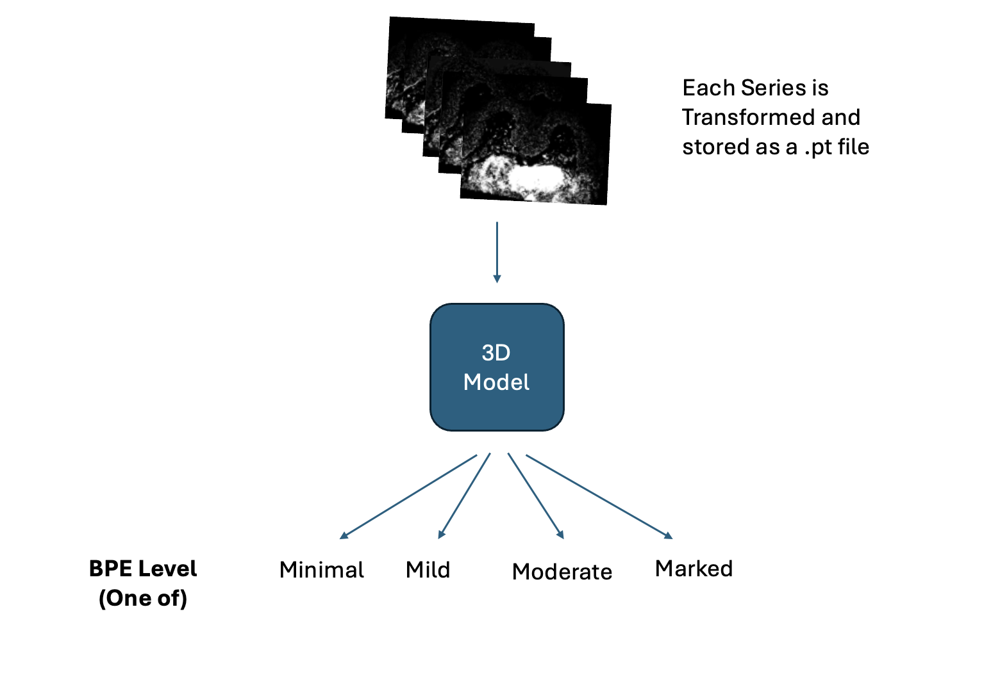

Understanding 3D Models - https://www.kaggle.com/code/mersico/understanding-1d-2d-and-3d-convolution-network

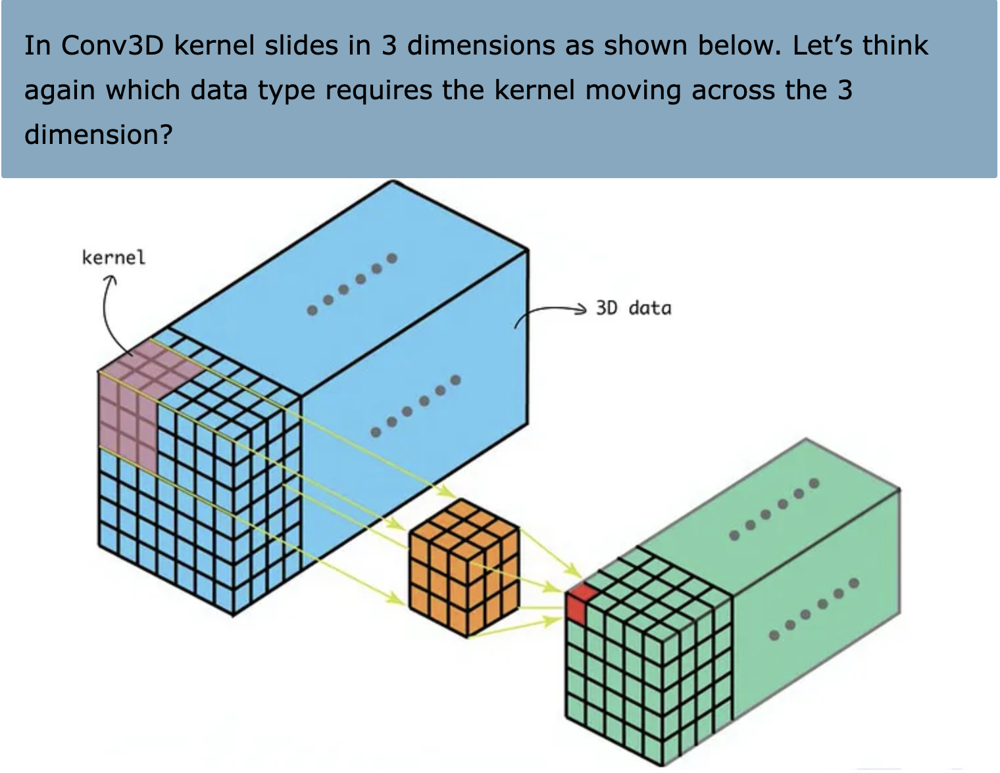

In [31]:
combined_df = pd.read_csv(r"/fsx/embed/summer-school-24/MRI_BPE_Datathon/combined_df.csv")

In [32]:
# Ensure that each study_instance corresponds to its label
study_instances = combined_df['StudyInstanceUID_anon'].unique()

# Extract the corresponding labels for each study_instance
labels = combined_df.groupby('StudyInstanceUID_anon')['BPE_type'].first().reindex(study_instances).values

# Stratified Split for Train (70%) and Temp (30% for Val + Test)
stratified_split = StratifiedShuffleSplit(n_splits=1, test_size=0.3, random_state=42)
train_idx, temp_idx = next(stratified_split.split(study_instances, labels))

# Further split the temp set into Validation (50% of 30% = 15%) and Test (50% of 30% = 15%)
stratified_split_val_test = StratifiedShuffleSplit(n_splits=1, test_size=0.5, random_state=42)
val_idx, test_idx = next(stratified_split_val_test.split(study_instances[temp_idx], labels[temp_idx]))

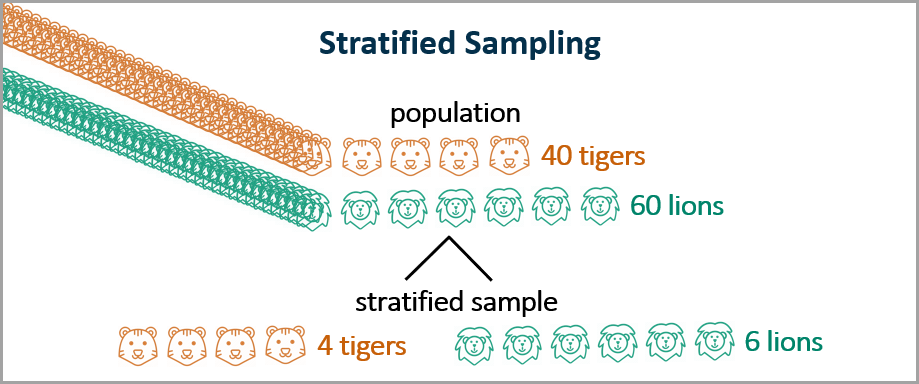

In [33]:
# Example usage
train_dir = '/fsx/embed/summer-school-24/MRI_BPE_Datathon/TRANSFORMED_DATA_v2/train'
val_dir = '/fsx/embed/summer-school-24/MRI_BPE_Datathon/TRANSFORMED_DATA_v2/val'
test_dir = '/fsx/embed/summer-school-24/MRI_BPE_Datathon/TRANSFORMED_DATA_v2/test'

train_dataset = MRIDataset(train_dir)
val_dataset = MRIDataset(val_dir)
test_dataset = MRIDataset(test_dir)

# Create DataLoader instances
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=4)

In [34]:
# Instantiate the model
model = Deeper3DCNN(num_classes=len(train_dataset.class_to_idx)).to(device)

In [35]:
# Initialize the LabelEncoder
label_encoder = LabelEncoder()

# Fit and transform the labels to integers
encoded_labels = label_encoder.fit_transform(labels)

# Calculate the class frequencies
class_counts = np.bincount(encoded_labels)
class_weights = 1.0 / class_counts

# Normalize the weights so that they sum to the number of classes
class_weights = class_weights / class_weights.sum() * len(class_counts)

# Convert to torch tensor
class_weights = torch.tensor(class_weights, dtype=torch.float32).to(device)

### Training

In [36]:
# Define loss function and optimizer
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model.parameters(), lr=0.001)

In [79]:
### MODEL TRAINING - DO NOT RUN - COMMENTED FOR REFERENCE - WE ALREADY HAVE TRAINED A MODEL AND IS AVAILABLE TO LOADED IN THE NEXT CELL###
# # Train the model
# train_model_3d(model, train_loader, val_loader, criterion, optimizer, device, num_epochs=200)

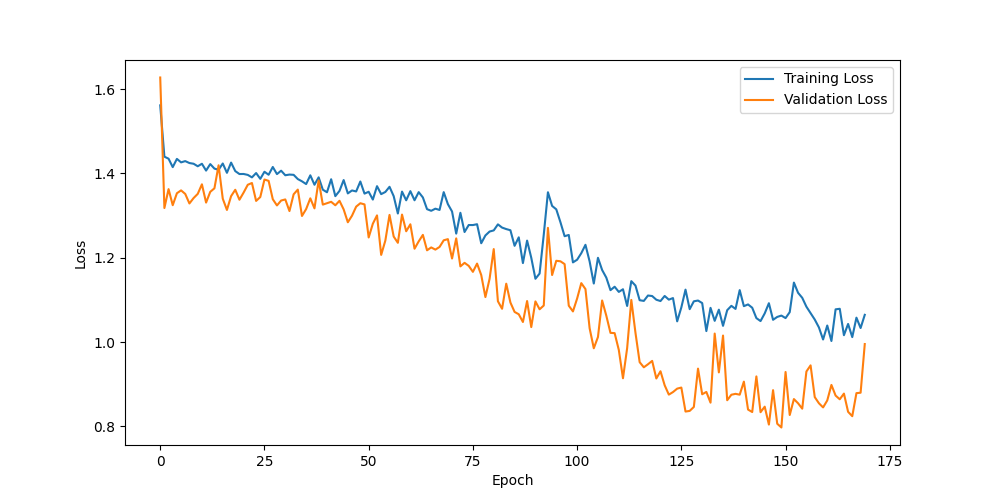

In [37]:
IPython.display.display(IPython.display.Image(filename='loss_curve_3d.png'))

### Load Saved Model

In [38]:
# Load the model for inference and move to the GPU
model = Deeper3DCNN(num_classes=len(train_dataset.class_to_idx))
model.load_state_dict(torch.load('best_model_3d.pt', map_location=device))
model.to(device)
model.eval()

Deeper3DCNN(
  (conv1): Conv3d(1, 32, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
  (bn1): BatchNorm3d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv3d(32, 64, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
  (bn2): BatchNorm3d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv3d(64, 128, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
  (bn3): BatchNorm3d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv3d(128, 256, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
  (bn4): BatchNorm3d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv5): Conv3d(256, 512, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
  (bn5): BatchNorm3d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool3d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout

### Evaluation

In [39]:
# Test the model
class_names = list(train_dataset.class_to_idx.keys())
# test_model(loaded_model, test_loader, class_names) # Uncomment to load saved model and comment out next line
test_model_3d(model, test_loader, class_names, device)

Test Accuracy: 76.43979057591623%

Classification Report:
              precision    recall  f1-score   support

      marked       0.73      0.76      0.74        21
        mild       0.90      0.76      0.83        68
     minimal       0.75      0.79      0.77        67
    moderate       0.62      0.71      0.67        35

    accuracy                           0.76       191
   macro avg       0.75      0.76      0.75       191
weighted avg       0.78      0.76      0.77       191


Confusion Matrix:
[[16  1  1  3]
 [ 1 52 10  5]
 [ 3  4 53  7]
 [ 2  1  7 25]]
AUC for class marked: 0.9745
AUC for class mild: 0.9012
AUC for class minimal: 0.8719
AUC for class moderate: 0.8822


{'marked': 0.9745098039215686,
 'mild': 0.9012434241989479,
 'minimal': 0.8719306692344728,
 'moderate': 0.8822344322344322}

In [42]:
# Example usage
study_id = "1.2.840.113971.3.58.1.47553203.20130323.1092040"
file_path = r'/fsx/embed/summer-school-24/MRI_BPE_Datathon/TRANSFORMED_DATA_v2/train/marked/' + study_id + '.pt'  # Replace with your series id
ten = visualize_and_predict_pt_3d(file_path, model, combined_df, class_names, device)

True Label: marked, Predicted Label: marked


In [43]:
combined_df['sampled_anon_dicom_path_pacs'] = r'/fsx/embed/summer-school-24/MRI_BPE_Datathon/GE_DATA/' + combined_df.anon_dicom_path_pacs.str[71:]

In [44]:
# load series
image, series_df = load_dicom_series(combined_df, combined_df[combined_df.StudyInstanceUID_anon == study_id].SeriesInstanceUID_anon.unique()[0])
# Display animations
print("Displaying original MRI animation:")
display(animate_images_3d(image, "MRI"))

Displaying original MRI animation:


## Training a Custom 2D model

### Maximum Intensity Projection Method to Convert 3D to 2D

- Lets also train a simple 2D model by converting the 3D MRI data to 2D by using a method called Maximum Intensity Projection
- Maximum Intensity Projection (MIP) reduces 3D MRI data to a single 2D image by projecting the highest intensity values, enhancing key structures and making the data compatible with 2D CNN models

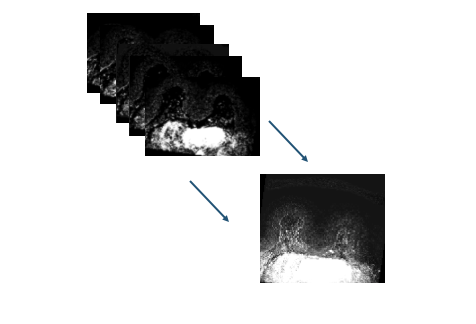

In [45]:
# Example usage
train_dir = '/fsx/embed/summer-school-24/MRI_BPE_Datathon/TRANSFORMED_DATA_v2/train'
val_dir = '/fsx/embed/summer-school-24/MRI_BPE_Datathon/TRANSFORMED_DATA_v2/val'
test_dir = '/fsx/embed/summer-school-24/MRI_BPE_Datathon/TRANSFORMED_DATA_v2/test'

train_dataset = MRIDataset2D(train_dir)
val_dataset = MRIDataset2D(val_dir)
test_dataset = MRIDataset2D(test_dir)

# Create DataLoader instances
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=4)

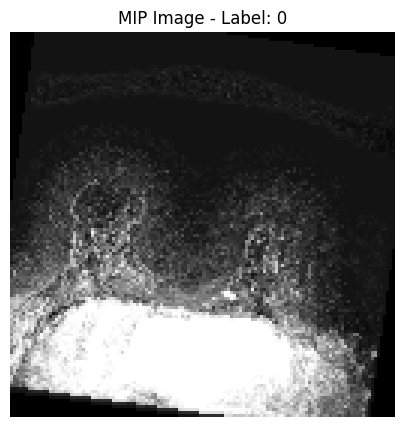

In [46]:
# Example usage:
# Assuming you have an instance of MRIDataset2D
dataset = MRIDataset2D(root_dir=train_dir)
visualize_mip_from_dataset(dataset, index=23)  # Replace index with the desired index to visualize

In [47]:
# Instantiate the model
model = Deeper2DCNN(num_classes=len(train_dataset.class_to_idx)).to(device)

In [48]:
# Define loss function and optimizer
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model.parameters(), lr=0.0001, weight_decay=1e-3)

# Train the model
# train_model_2d_mip(model, train_loader, val_loader, criterion, optimizer, device, num_epochs=50)

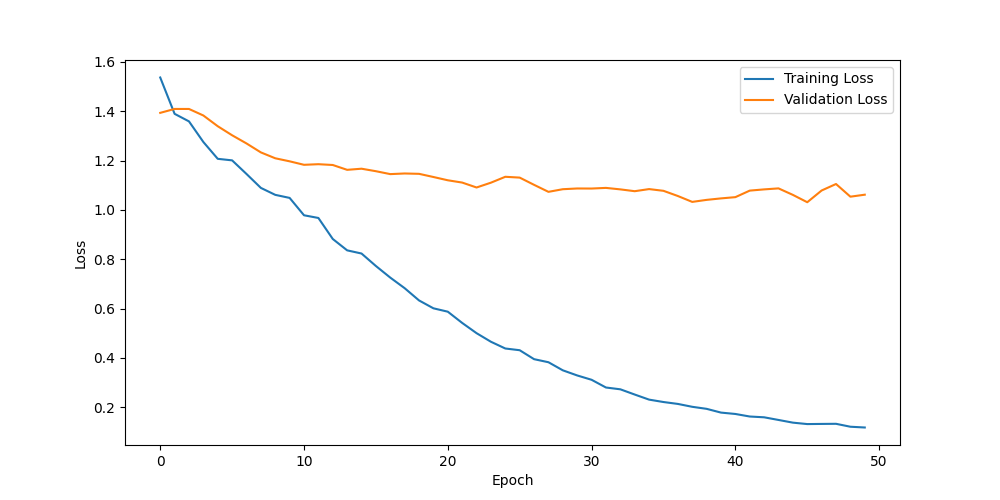

In [49]:
IPython.display.display(IPython.display.Image(filename='loss_curve_2d_mip.png'))

In [50]:
# Load the model for inference and move to the GPU
model = Deeper2DCNN(num_classes=len(train_dataset.class_to_idx))
model.load_state_dict(torch.load('best_model_2d_mip.pt', map_location=device))
model.to(device)
model.eval()

Deeper2DCNN(
  (conv1): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn5): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout2d(p=0.5, inplace=False)
  (fc1): Linear(in_feat

In [51]:
# Test the model
class_names = list(train_dataset.class_to_idx.keys())
test_model_2d(model, test_loader, class_names, device)

Test Accuracy: 60.20942408376963%

Classification Report:
              precision    recall  f1-score   support

      marked       0.50      0.67      0.57        21
        mild       0.71      0.60      0.65        68
     minimal       0.71      0.54      0.61        67
    moderate       0.44      0.69      0.54        35

    accuracy                           0.60       191
   macro avg       0.59      0.62      0.59       191
weighted avg       0.64      0.60      0.61       191


Confusion Matrix:
[[14  0  1  6]
 [ 5 41 11 11]
 [ 6 12 36 13]
 [ 3  5  3 24]]
AUC for class marked: 0.8938
AUC for class mild: 0.7868
AUC for class minimal: 0.7758
AUC for class moderate: 0.8297


{'marked': 0.8938375350140055,
 'mild': 0.7868244858919177,
 'minimal': 0.7757583052479539,
 'moderate': 0.8296703296703296}

True Label: marked, Predicted Label: marked


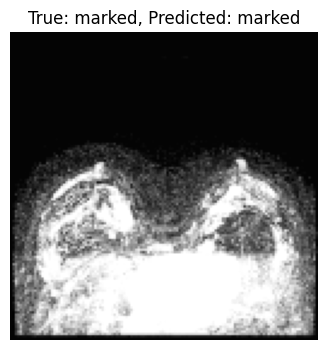

In [52]:
# Example usage
study_id = "1.2.840.113976.3.66.1.54188402.20161231.1"  # Replace with your series ID
file_path = r'/fsx/embed/summer-school-24/MRI_BPE_Datathon/TRANSFORMED_DATA_v2/test/marked/' + study_id + '.pt'  # Replace with your series ID
visualize_and_predict_2d_mip(file_path, model, combined_df, class_names, device)

### Let's Just Pick the Middle Slice for our 2D Model

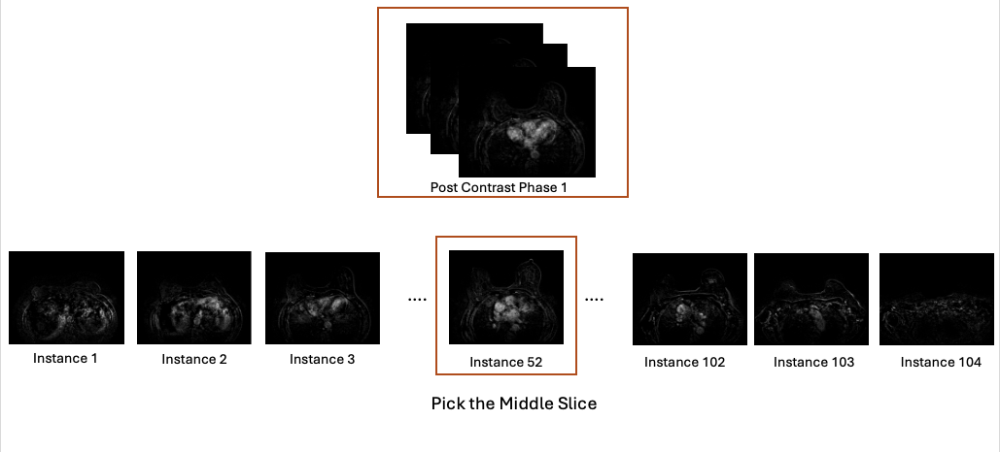

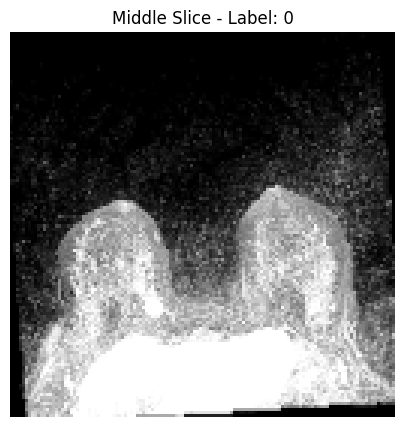

In [53]:
# Example usage:
# Assuming you have an instance of MRIDataset2D
dataset = MRIDataset2DMiddleSlice(root_dir=train_dir)
visualize_middle_slice(dataset, index=4) # change index to check other examples

In [54]:
# Example usage
train_dir = '/fsx/embed/summer-school-24/MRI_BPE_Datathon/TRANSFORMED_DATA_v2/train'
val_dir = '/fsx/embed/summer-school-24/MRI_BPE_Datathon/TRANSFORMED_DATA_v2/val'
test_dir = '/fsx/embed/summer-school-24/MRI_BPE_Datathon/TRANSFORMED_DATA_v2/test'

train_dataset = MRIDataset2DMiddleSlice(train_dir)
val_dataset = MRIDataset2DMiddleSlice(val_dir)
test_dataset = MRIDataset2DMiddleSlice(test_dir)

# Create DataLoader instances
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False, num_workers=4)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False, num_workers=4)

In [55]:
# Instantiate the model
model = Deeper2DCNN(num_classes=len(train_dataset.class_to_idx)).to(device)

In [61]:
# Define loss function and optimizer
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model.parameters(), lr=0.0001, weight_decay=1e-4)

# Train the model
# train_model_2d_mid_slice(model, train_loader, val_loader, criterion, optimizer, device, num_epochs=50)

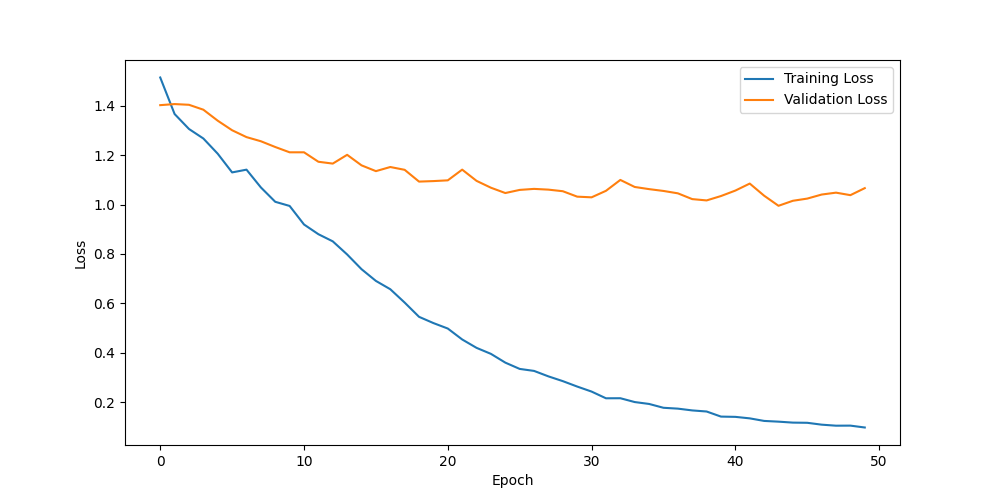

In [57]:
IPython.display.display(IPython.display.Image(filename='loss_curve_2d_mid_slice.png'))

In [58]:
# Load the model for inference and move to the GPU
model = Deeper2DCNN(num_classes=len(train_dataset.class_to_idx))
model.load_state_dict(torch.load('best_model_2d_mid_slice.pt', map_location=device))
model.to(device)
model.eval()

Deeper2DCNN(
  (conv1): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn1): BatchNorm2d(16, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn2): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv4): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv5): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (bn5): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (dropout): Dropout2d(p=0.5, inplace=False)
  (fc1): Linear(in_feat

In [59]:
# Test the model
class_names = list(train_dataset.class_to_idx.keys())
# test_model(loaded_model, test_loader, class_names) # Uncomment to load saved model and comment out next line
test_model_2d(model, test_loader, class_names, device)

Test Accuracy: 60.73298429319372%

Classification Report:
              precision    recall  f1-score   support

      marked       0.52      0.71      0.60        21
        mild       0.70      0.69      0.70        68
     minimal       0.66      0.57      0.61        67
    moderate       0.43      0.46      0.44        35

    accuracy                           0.61       191
   macro avg       0.58      0.61      0.59       191
weighted avg       0.62      0.61      0.61       191


Confusion Matrix:
[[15  0  3  3]
 [ 3 47 11  7]
 [ 7 11 38 11]
 [ 4  9  6 16]]
AUC for class marked: 0.9249
AUC for class mild: 0.8276
AUC for class minimal: 0.8223
AUC for class moderate: 0.7813


{'marked': 0.9249299719887956,
 'mild': 0.8275944524151123,
 'minimal': 0.8223399133365431,
 'moderate': 0.7813186813186813}

True Label: marked, Predicted Label: moderate


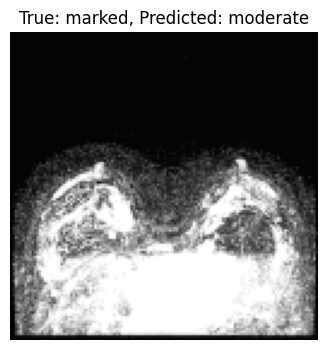

In [60]:
# Example usage
study_id = "1.2.840.113976.3.66.1.54188402.20161231.1"  # Replace with your series ID
file_path = r'/fsx/embed/summer-school-24/MRI_BPE_Datathon/TRANSFORMED_DATA_v2/test/marked/' + study_id + '.pt'  # Replace with your series ID
visualize_and_predict_2d_mid_slice(file_path, model, combined_df, class_names, device)

# Model Comparison

| Metric                        | Model 1: 3D CNN | Model 2: 2D Model with MIP | Model 3: 2D Model with Middle Slice |
|-------------------------------|-----------------|----------------------------|-------------------------------------|
| **Test Accuracy**             | 76.44%          | 60.21%                     | 63.35%                              |
| **Precision (Marked)**        | 0.73            | 0.50                       | 0.50                                |
| **Precision (Mild)**          | 0.90            | 0.71                       | 0.70                                |
| **Precision (Minimal)**       | 0.75            | 0.71                       | 0.71                                |
| **Precision (Moderate)**      | 0.62            | 0.44                       | 0.51                                |
| **Recall (Marked)**           | 0.76            | 0.67                       | 0.67                                |
| **Recall (Mild)**             | 0.76            | 0.60                       | 0.57                                |
| **Recall (Minimal)**          | 0.79            | 0.54                       | 0.70                                |
| **Recall (Moderate)**         | 0.71            | 0.69                       | 0.60                                |
| **F1-Score (Marked)**         | 0.74            | 0.57                       | 0.57                                |
| **F1-Score (Mild)**           | 0.83            | 0.65                       | 0.63                                |
| **F1-Score (Minimal)**        | 0.77            | 0.61                       | 0.71                                |
| **F1-Score (Moderate)**       | 0.67            | 0.54                       | 0.55                                |
| **Overall Accuracy**          | 0.76            | 0.60                       | 0.63                                |
| **AUC (Marked)**              | 0.9745          | 0.8938                     | 0.8843                              |
| **AUC (Mild)**                | 0.9012          | 0.7868                     | 0.7927                              |
| **AUC (Minimal)**             | 0.8719          | 0.7758                     | 0.8495                              |
| **AUC (Moderate)**            | 0.8822          | 0.8297                     | 0.8288                              |

### Confusion Matrices

| Model 1: 3D CNN               | Model 2: 2D Model with MIP     | Model 3: 2D Model with Middle Slice |
|-------------------------------|--------------------------------|-------------------------------------|
| [[16  1  1  3]                | [[14  0  1  6]                 | [[14  1  2  4]                      |
|  [ 1 52 10  5]                |  [ 5 41 11 11]                 |  [ 6 39 13 10]                      |
|  [ 3  4 53  7]                |  [ 6 12 36 13]                 |  [ 5  9 47  6]                      |
|  [ 2  1  7 25]]               |  [ 3  5  3 24]]                |  [ 3  7  4 21]]                     |

## Summary

### 1. We Talked About MRI and it's Fundamentals
- Overview of MRI and Breast MRI
- Typical Breast MRI Study
- Background Parenchymal Enhancement and it's significance

### 2. Ways to Preprocess MRI data
- Image Flip, Subtraction and Registration
- Data Preprocessing and Preparation for Model Input and it's nauances
- Series and Slice selection
- Other ways to prepare data - stitching, using all series, etc

### 3. MRI Modeling - 3D vs 2D - Techniques
- Comparison of Modeling Techniques and their performances
- 2D Modeling techniques
- Approaching a 3D problem and when to approach it as a 2D problem